In [34]:
from mazeAgentUtils import * 
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Setting parameters
Initialising
   making state/history dataframes
   initialising velocity, position and direction
   setting time/run counters
   making the maze walls
   discretising position for later plotting
   handling undefined parameters
   initialising basis features for learning
   checking basis cells aren't too close
     min seperation distance:  10.0 cm
       592  overlapping pairs
       579  overlapping pairs
       534  overlapping pairs
       543  overlapping pairs
       559  overlapping pairs
       542  overlapping pairs
       541  overlapping pairs
       549  overlapping pairs
       547  overlapping pairs
       521  overlapping pairs
       528  overlapping pairs
     min seperation distance:  9.0 cm
       434  overlapping pairs
       435  overlapping pairs
       451  overlapping pairs
       436  overlapping pairs
       437  overlapping pairs
       431  overlapping pairs
       437  overlapping pairs
       450  overlapping pairs
       434  overlappi

(<Figure size 1200x1200 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f804b9145f8>)

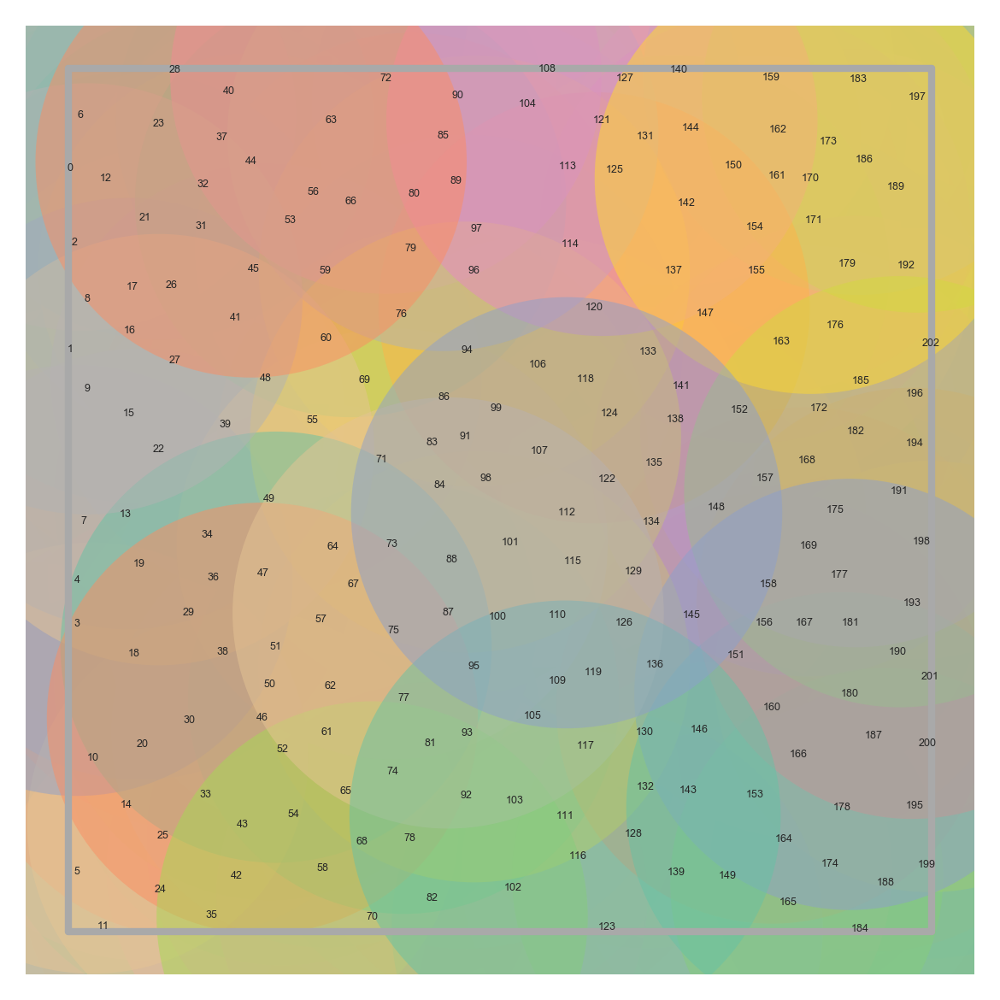

In [51]:
N = 10
params = { 
          'mazeType'           : 'oneRoom',  #type of maze, define in getMaze() function
          'stateType'          : 'gaussian', #feature on which to TD learn (onehot, gaussian, gaussianCS, fourier, circles)
          'movementPolicy'     : 'randomWalk',  #movement policy (raudies, random walk, windows screensaver)
          'roomSize'           : 1,          #maze size scaling parameter, metres
          'dt'                 : 0.003,       #simulation time disretisation 
          'dx'                 : 0.05,       #space discretisation (for plotting, movement is continuous)
          'tau'                : 6,          #TD decay time, seconds
          'TDdx'               : 0.02,       #rough distance between TD learning updates, metres 
          'alpha'              : 0.01,       #TD learning rate 
          'nCells'             : None,       #how many features to use
          'cellFiringRate'     : 10,         #peak firing rate of a cell (middle of place field, preferred theta phase)
          'centres'            : None,       #array of receptive field positions. Overwrites nCells
          'speedScale'         : 0.16,       #movement speed scale, metres/second
          'rotSpeedScale'      : None,       #rotational speed scale, radians/second
          'initPos'            : None,       #initial position [x0, y0], metres
          'initDir'            : None,       #initial direction, unit vector
          'sigma'              : 0.25,        #feature cell width scale, relevant for  gaussin, gaussianCS, circles
          'placeCellThreshold' : 0,        #place cell threshold value (fraction of its maximum)
          'gridCellThreshold'  : 0,          #grid cell threshold value (fraction of its maximum)
          'doorsClosed'        : False,       #whether doors are opened or closed in multicompartment maze
          'tau_pre'            : 20e-3,      #rate potentiating trace decays
          'tau_post'           : 20e-3,      #rate depressing trace decays 
          'eta_pre'            : 0.01,       #learning rate for pre to post strengthening 
          'eta_post'           : 0.01,       #learning rate for post to pre weakening
          'a_pre'              : 1,          #per trace bump when cell spikes
          'a_post'             : 0.3,        #post trace bump when cell spikes
          'w_max'              : 20e-3       #max STDP weights
}


agent =  MazeAgent(params)
agent.extent
plotter = Visualiser(agent)
# plotter.plotMazeStructure(save=True)
plotter.plotFeatureCells(shufflebeforeplot=True)

In [52]:
# agent.pos = np.array([0.5,0.5])
# agent.vel = np.array([1,0])
agent.runRat(trainTime=2,STDPLearn=True,TDSRLearn=False,saveEvery=None)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


  0%|          | 0/40000 [00:00<?, ?it/s]

Calculating place and grid cells


(<Figure size 1500x300 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f8032e16860>)

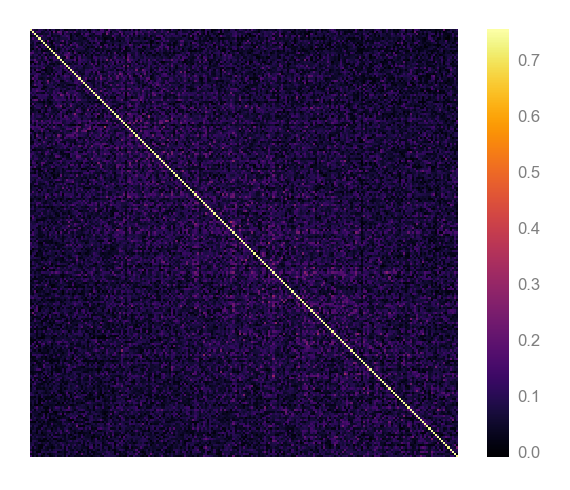

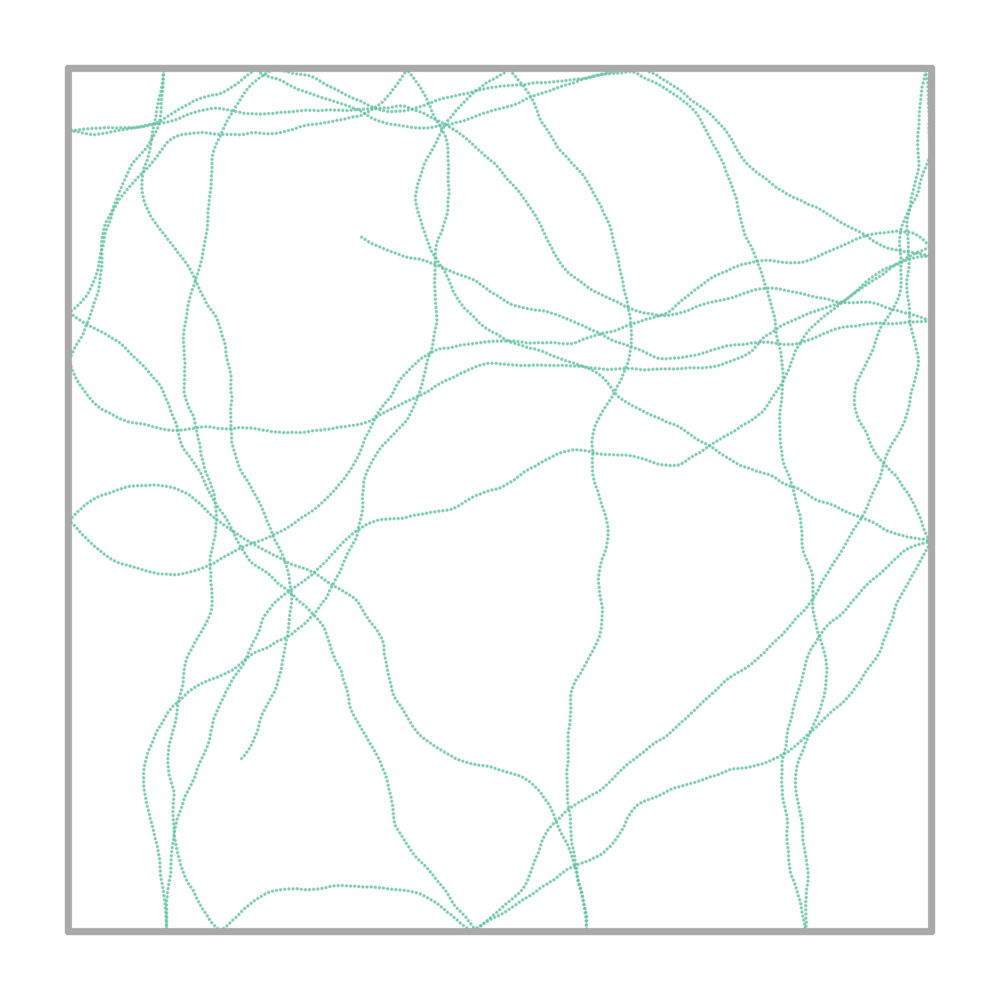

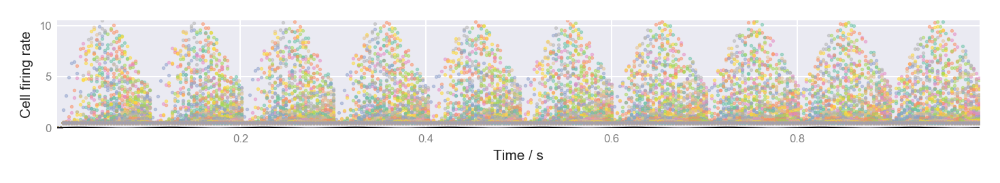

In [50]:
plotter = Visualiser(agent)

plotter.plotM(STDP=True)
plotter.plotTrajectory(skiprate=10)
plotter.plotSTDPFiringRates(endtime=1/60)

# plotter.plotPlaceField(number=N_plot,time=0,STDP=True)
# plotter.plotPlaceField(number=N_plot,STDP=True)
# plotter.plotGridField(number=N_plot,STDP=True)

# plotter.plotReceptiveField(number=50)

# plotter.plotGridField(number='many',STDP=True)

# plotter.animateField(field='M',interval=200)
# plotter.animateField(field='place',number=-10,interval=200)



In [29]:
agent.snapshots

,t,M,W,mazeState
0,0,"[[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",NaN,"{'walls': {'room1': [[[0 0] [0 1]], [[0 1] [..."
0,599.985,"[[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.014889777986569316, 0.001323510676660212, ...","{'walls': {'room1': [[[0 0] [0 1]], [[0 1] [..."
